# Labrador Burn Scar ISP
### John Miller - ACENET Certificate in Advanced Computing 
##### Testing unsupervised (clustering) classification

In [29]:
# import libraries
import numpy as np
import pandas as pd
import geopandas as gpd
import fiona
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.colors as mc

import rasterio as rio
from rasterio import plot
#from rasterio.features import shapes
from rasterio.mask import mask
from rasterio.plot import show

#from shapely.geometry import mapping

from skimage import exposure, morphology
from sklearn import cluster
from sklearn import svm

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

import warnings
#warnings.simplefilter(action = "ignore", category = RuntimeWarning)
#warnings.simplefilter(action = "ignore", category = UserWarning)
warnings.simplefilter(action = "ignore", category = FutureWarning)

In [2]:
# Open bands used in analysis

# blue band
b2 = rio.open("../Raster/T20UQC_20230922T150719_B02_20m.jp2")
# green band
b3 = rio.open("../Raster/T20UQC_20230922T150719_B03_20m.jp2")
# red band
b4 = rio.open("../Raster/T20UQC_20230922T150719_B04_20m.jp2")
# near infrared band
b8a = rio.open("../Raster/T20UQC_20230922T150719_B8A_20m.jp2")
# short wave infrared band
b12 = rio.open("../Raster/T20UQC_20230922T150719_B12_20m.jp2")
# scene classification
scl = rio.open("../Raster/T20UQC_20230922T150719_SCL_20m.jp2")

print(b2.meta)

{'driver': 'JP2OpenJPEG', 'dtype': 'uint16', 'nodata': None, 'width': 5490, 'height': 5490, 'count': 1, 'crs': CRS.from_epsg(32620), 'transform': Affine(20.0, 0.0, 699960.0,
       0.0, -20.0, 5800020.0)}


In [3]:
# Let's make a natural colour composite

# Take the metadata from one of our bands
meta = b2.meta
# Update the meta veriable so that count = 3 (3 bands)
meta.update({"count":3})

# Set out raster path
out_raster_nat = "../Raster/studyArea_naturalColour.tif"

# Write the red, green, and blue bands to the out raster
# **meta adds the metadata we saved
with rio.open(out_raster_nat, 'w', **meta) as dest:
    dest.write(b4.read(1),1)
    dest.write(b3.read(1),2)
    dest.write(b2.read(1),3)

(3, 5490, 5490)
(5490, 5490, 3)


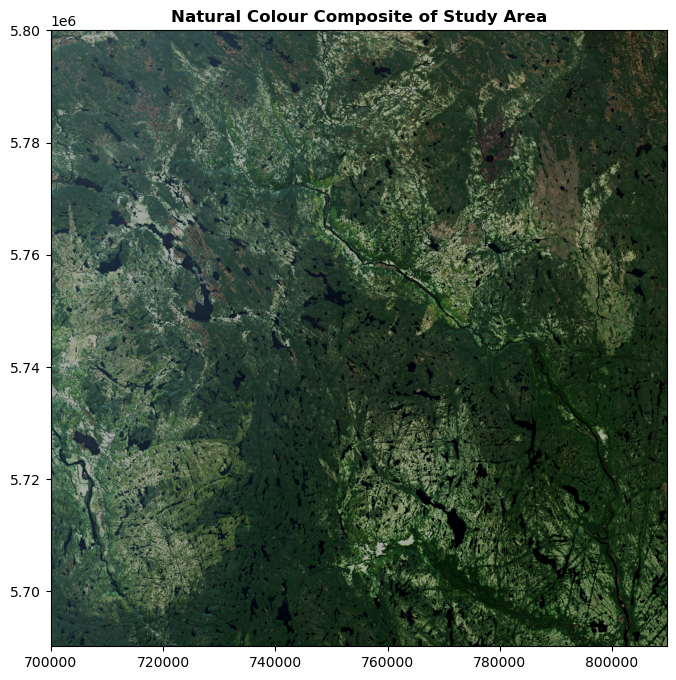

<Axes: title={'center': 'Natural Colour Composite of Study Area'}>

In [4]:
# Let's view the natural colour composite

# Open natural composite raster
natural_comp_raster = rio.open(out_raster_nat)

# Read natural composite raster as an array
natural_comp_array = natural_comp_raster.read()

# Print the shape (bands, rows, cols) to make sure it looks good
print(natural_comp_array.shape)

# Transpose the array
natural_comp_array = natural_comp_array.transpose(1,2,0)
print(natural_comp_array.shape)

# Clip the lower and upper 2 percentiles to elminate a potential contrast decrease caused by outliers
p2, p98 = np.percentile(natural_comp_array, (2,98)) 

# Use skimage to rescale the intensity. The values will range from 0 to 1
natural_comp_array = exposure.rescale_intensity(natural_comp_array, in_range=(p2, p98)) / 100000

# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the natural colour composite
title = "Natural Colour Composite of Study Area"
show(natural_comp_array.transpose(2,0,1), transform=natural_comp_raster.transform, title=title)

In [5]:
# Let's make a false colour composite

# Take the metadata from one of our bands
meta = b2.meta
# Update the meta veriable so that count = 3 (3 bands)
meta.update({"count":3})

# Set out raster path
out_raster_false = "../Raster/studyArea_falseColour.tif"

# Write the shortwave infrared, infrared, and blue bands to the out raster
# **meta adds the metadata we saved
with rio.open(out_raster_false, 'w', **meta) as dest:
    dest.write(b12.read(1),1)
    dest.write(b8a.read(1),2)
    dest.write(b2.read(1),3)

(3, 5490, 5490)
(5490, 5490, 3)


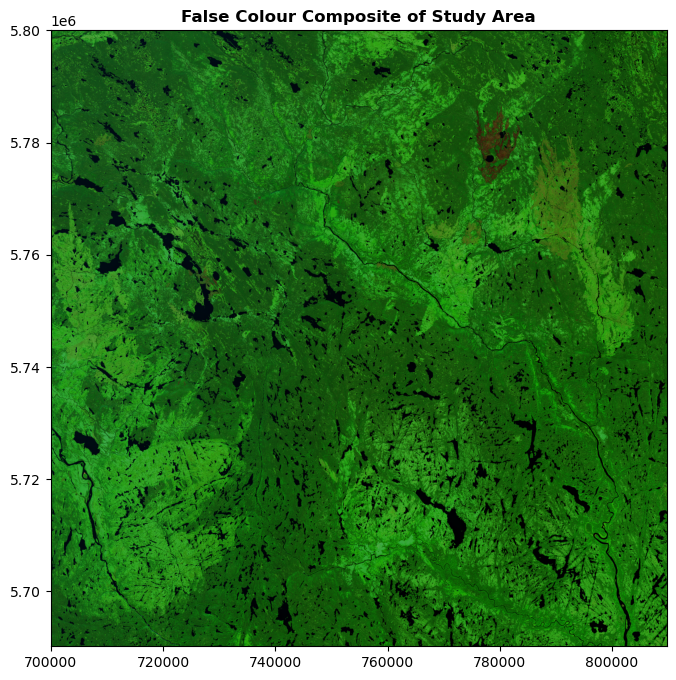

<Axes: title={'center': 'False Colour Composite of Study Area'}>

In [6]:
# Let's view the false colour composite

# Open false composite raster
false_comp_raster = rio.open(out_raster_false)

# Read false composite raster as an array
false_comp_array = false_comp_raster.read()

# Print the shape (bands, rows, cols) to make sure it looks good
print(false_comp_array.shape)

# Transpose the array
false_comp_array = false_comp_array.transpose(1,2,0)
print(false_comp_array.shape)

# Clip the lower and upper 2 percentiles to elminate a potential contrast decrease caused by outliers
p2, p98 = np.percentile(false_comp_array, (2,98)) 

# Use skimage to rescale the intensity. The values will range from 0 to 1
false_comp_array = exposure.rescale_intensity(false_comp_array, in_range=(p2, p98)) / 100000

# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the false colour composite
title = "False Colour Composite of Study Area"
show(false_comp_array.transpose(2,0,1), transform=false_comp_raster.transform, title=title)

In [7]:
# Create a Normalized Burn Ratio (NBR)
# NBR = (NIR - SWIR) / (NIR + SWIR)

# Read in NIR & SWIR bands
nir = b8a.read()
swir = b12.read()

# Calculate NBR
nbr = (nir.astype(float)-swir.astype(float))/(nir+swir)

# Extract metadata from one of the bands and update
meta = b12.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

# Set out raster path
out_raster_nbr = "../Raster/studyArea_NBR.tif"

# Write the NBR to the out raster
with rio.open(out_raster_nbr, 'w', **meta) as dest:
    dest.write(nbr.astype(rio.float32))

(1, 5490, 5490)


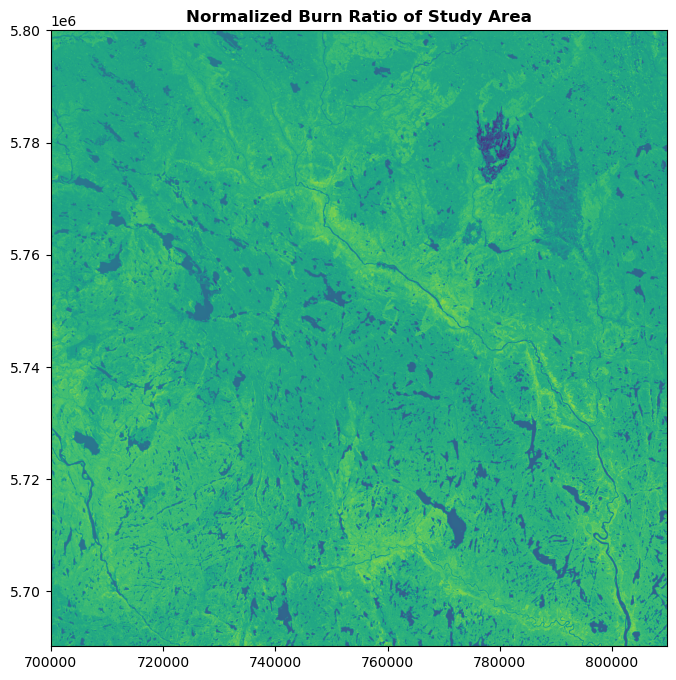

<Axes: title={'center': 'Normalized Burn Ratio of Study Area'}>

In [8]:
# Display the NBR raster
nbr_raster = rio.open(out_raster_nbr)
nbr_array = nbr_raster.read()


# Print the shape (bands, rows, cols) to make sure it looks good
print(nbr_array.shape)

# Transpose the array
#nbr_array = nbr_array.transpose(1,2,0)
#print(nbr_array.shape)

# Clip the lower and upper 2 percentiles to elminate a potential contrast decrease caused by outliers
#p2, p98 = np.percentile(nbr_array, (2,98)) 

# Use skimage to rescale the intensity. The values will range from 0 to 1
#nbr_array = exposure.rescale_intensity(nbr_array, in_range=(p2, p98)) / 100000


# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the false colour composite
title = "Normalized Burn Ratio of Study Area"
#show(nbr_array.transpose(2,0,1), transform=nbr_raster.transform, title=title)
show(nbr_array, transform=nbr_raster.transform, title=title)

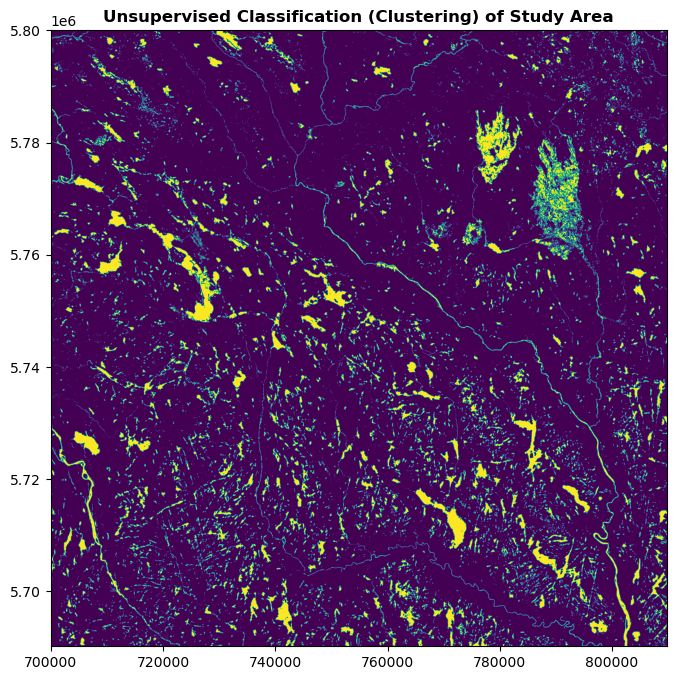

CPU times: total: 1min 22s
Wall time: 41.2 s


<Axes: title={'center': 'Unsupervised Classification (Clustering) of Study Area'}>

In [9]:
%%time

# Perform an unsupervised classification

# Create an empty array with the same dimensions and data type as our raster array
empty_array = np.empty((nbr_raster.height, nbr_raster.width, nbr_raster.count), nbr_raster.meta['dtype'])
#print(empty_array.shape)

# loop through the raster's bands to fill the empty array
for band in range(empty_array.shape[2]):
    empty_array[:,:,band] = nbr_raster.read(band+1)

#print(empty_array.shape)

# convet to 1d array
img1d = empty_array[:,:,:3].reshape((empty_array.shape[0]*empty_array.shape[1],empty_array.shape[2]))

#print(img1d.shape)

# create an object of the classifier and train it
cl = cluster.KMeans(n_clusters=2)
param = cl.fit(img1d)

#print(cl.labels_)

# get the labels of the classes and reshape it x-y-bands shape order (one band only)
img_cl = cl.labels_
img_cl = img_cl.reshape(empty_array[:,:,0].shape)

#print(img_cl.shape)

# Create a custom color map to represent the classes
#cmap = mc.LinearSegmentedColormap.from_list("", ["green","black"])

# Show the resulting array and save it as jpg image
plt.figure(figsize=[8,8])
#plt.imshow(img_cl, cmap=cmap)
#plt.axis('off')
#plt.show()
title = "Unsupervised Classification (Clustering) of Study Area"
show(img_cl, transform=nbr_raster.transform, title=title)

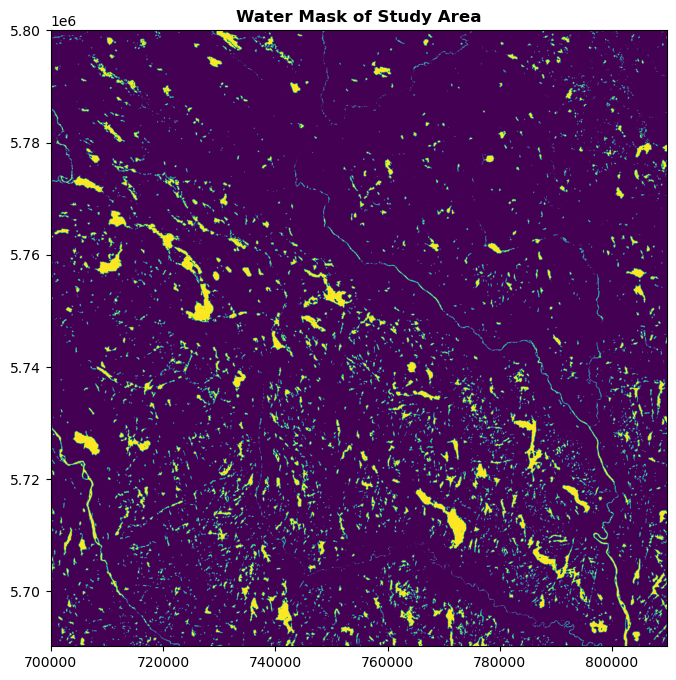

<Axes: title={'center': 'Water Mask of Study Area'}>

In [10]:
# Create a water mask
# The scl raster is a classified raster. Pixels with a value of 6 are water

# Read in the scl raster
scl_array = scl.read()

# Create a water mask by making all values != 6 equal to 0
# Converting to 0 will help when adding the water mask to the unsupervised classification
water_mask = np.where(scl_array != 6, 0, scl_array)

meta = scl.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

water_path = '../Raster/studyArea_waterMask.tif'

with rio.open(water_path, 'w', **meta) as dest:
    dest.write(water_mask.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Water Mask of Study Area"
show(water_mask, transform=nbr_raster.transform, title=title)

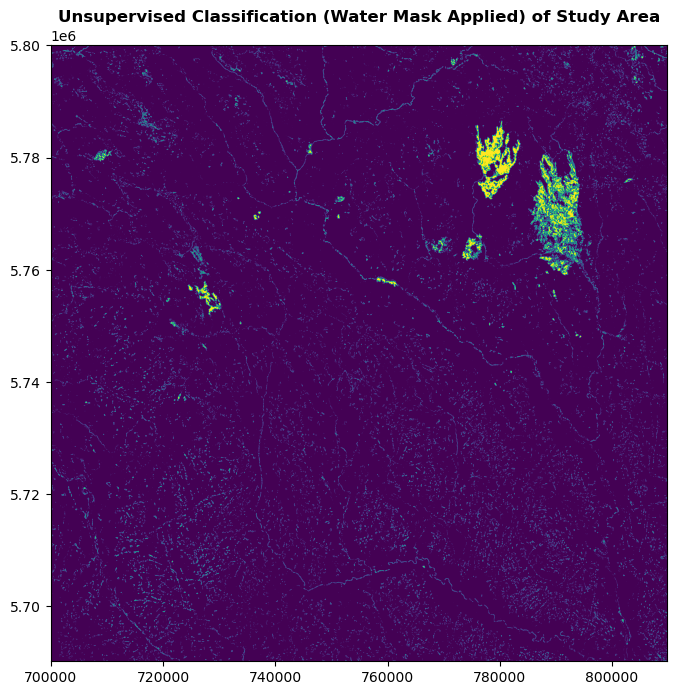

<Axes: title={'center': 'Unsupervised Classification (Water Mask Applied) of Study Area'}>

In [11]:
# Remove water from classified raster

water_raster = rio.open(water_path)
water_array = water_raster.read()

no_water = img_cl.astype(rio.float32) + water_array.astype(rio.float32)
#print(no_water)

classified_no_water = np.where(no_water > 1, 0, no_water)
#print(classified_no_water)

meta = water_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

unsupervised_path = '../Raster/studyArea_unsupervisedClassification.tif'

with rio.open(unsupervised_path, 'w', **meta) as dest:
    dest.write(classified_no_water.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Unsupervised Classification (Water Mask Applied) of Study Area"
show(classified_no_water, transform=nbr_raster.transform, title=title)

Based on our unsupervised classification, as of Sept 22, 2023, ~10,241.28 hectares of land has been damaged by wildfires.



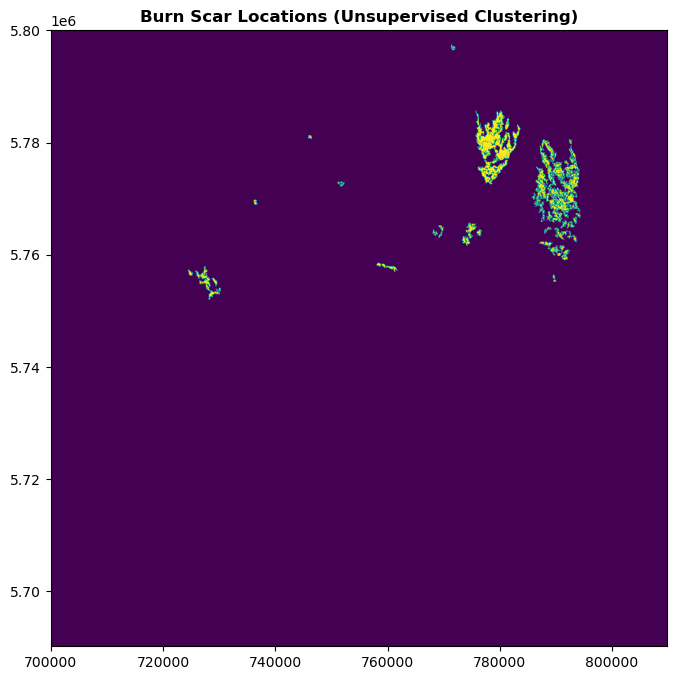

<Axes: title={'center': 'Burn Scar Locations (Unsupervised Clustering)'}>

In [12]:
# Clean the unsupervised classification by removing noise

# Read in the classified raster and convert to boolean
unsupervised_raster = rio.open(unsupervised_path)
unsupervised_array = unsupervised_raster.read().astype(bool)

# Use skimage to remove pixel clusters that are smaller in size
cleaned = morphology.remove_small_objects(unsupervised_array, min_size=600, connectivity=1)

# Get count of True pixels (pixels that are burned)
burn_pixels = np.count_nonzero(cleaned == True)

# Get total burnt area in hectares
# Number of pixels times 20x20 m pixel size divided by 10000
total_area_hect = burn_pixels * 400 / 10000

print(f"Based on our unsupervised classification, as of Sept 22, 2023, ~{total_area_hect:,.2f} hectares of land has been damaged by wildfires.\n")

meta = unsupervised_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

burn_scar_path = '../Raster/burnScars_unsupervisedClassification.tif'

with rio.open(burn_scar_path, 'w', **meta) as dest:
    dest.write(cleaned.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Burn Scar Locations (Unsupervised Clustering)"
show(cleaned, transform=nbr_raster.transform, title=title)


  Classcode  Classname  Classvalue  RED  GREEN  BLUE  Count  \
0      None  Burn Scar           1  171     24     9      1   
1      None  Burn Scar           1  171     24     9      1   
2      None  Burn Scar           1  171     24     9      1   
3      None  Burn Scar           1  171     24     9      1   
4      None  Burn Scar           1  171     24     9      1   

                                 geometry  
0  POINT Z (777745.456 5779491.695 0.000)  
1  POINT Z (781179.267 5782927.134 0.000)  
2  POINT Z (781071.336 5778028.561 0.000)  
3  POINT Z (778719.162 5775492.869 0.000)  
4  POINT Z (777427.597 5774827.366 0.000)  


<Axes: >

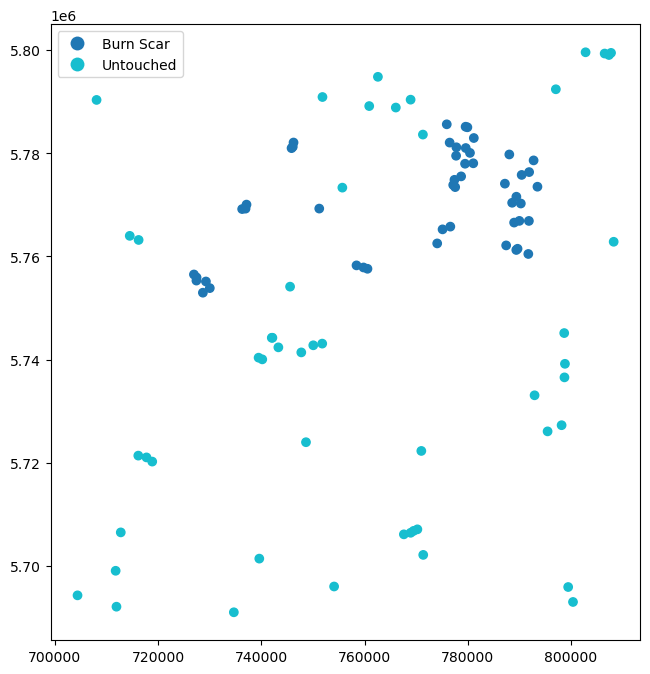

In [13]:
# Bring in training data shapefile using Geopandas
training_path = "../Vector/trainingData_pts.shp"
training_data = gpd.read_file(training_path)
print(training_data.head())

# Display training data
training_data.plot(column='Classname', cmap=None, legend=True, figsize=(8, 8))

In [14]:
# Add ID column to training data
training_data = training_data.assign(id=range(len(training_data)))
print(training_data.head())

# Save a copy of the training data with the ID column
train_ID_path = "../Vector/trainingData_withID.shp"
training_data.to_file(train_ID_path)

  Classcode  Classname  Classvalue  RED  GREEN  BLUE  Count  \
0      None  Burn Scar           1  171     24     9      1   
1      None  Burn Scar           1  171     24     9      1   
2      None  Burn Scar           1  171     24     9      1   
3      None  Burn Scar           1  171     24     9      1   
4      None  Burn Scar           1  171     24     9      1   

                                 geometry  id  
0  POINT Z (777745.456 5779491.695 0.000)   0  
1  POINT Z (781179.267 5782927.134 0.000)   1  
2  POINT Z (781071.336 5778028.561 0.000)   2  
3  POINT Z (778719.162 5775492.869 0.000)   3  
4  POINT Z (777427.597 5774827.366 0.000)   4  


In [15]:
# Let's train our data

training_df = pd.DataFrame(training_data.drop(columns=['geometry', 'Classcode']))
sampled = pd.Series()

# Read input shapefile with fiona and iterate over each feature
with fiona.open(train_ID_path) as shp:
    for feature in shp:
        siteID = feature['properties']['id']
        coords = feature['geometry']['coordinates']
        # Read pixel value at the given coordinates using Rasterio
        # NB: `sample()` returns an iterable of ndarrays.
        #with nbr_raster as stack_src:
        value = [v for v in nbr_raster.sample([coords])]
        #print(value)
        # Update the pandas serie accordingly
        sampled.loc[siteID] = value
print(sampled)
# reshaping sampled values
df1 = pd.DataFrame(sampled.values.tolist(), index=sampled.index)
df1['id'] = df1.index
df1 = pd.DataFrame(df1[0].values.tolist(), columns=['PixelValue'])
df1['id'] = df1.index

data = pd.merge(df1, training_df, on ='id')
print('Sampled Data: \n',data)

X = data.iloc[:,0:1].values
y = data.iloc[:,3].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify = y)

print(f'X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}')

0     [[-0.07841709]]
1     [[-0.05079292]]
2     [[-0.14018692]]
3     [[-0.16512059]]
4      [[0.11504018]]
           ...       
95      [[0.3627235]]
96     [[0.44601798]]
97     [[0.27178082]]
98     [[0.31787553]]
99      [[0.5048202]]
Length: 100, dtype: object
Sampled Data: 
     PixelValue  id  Classname  Classvalue  RED  GREEN  BLUE  Count
0    -0.078417   0  Burn Scar           1  171     24     9      1
1    -0.050793   1  Burn Scar           1  171     24     9      1
2    -0.140187   2  Burn Scar           1  171     24     9      1
3    -0.165121   3  Burn Scar           1  171     24     9      1
4     0.115040   4  Burn Scar           1  171     24     9      1
..         ...  ..        ...         ...  ...    ...   ...    ...
95    0.362723  95  Untouched           0  255    255     0      1
96    0.446018  96  Untouched           0  255    255     0      1
97    0.271781  97  Untouched           0  255    255     0      1
98    0.317876  98  Untouched           0  25

In [16]:
#unique, counts = np.unique(y, return_counts=True)
#print(unique, counts)
#print(data.values)
#print(X)
#print(y)
print(nbr_array)
print(img1d.shape)

[[[0.26612905 0.26163724 0.27047014 ... 0.2467223  0.25761446 0.2636081 ]
  [0.26346824 0.25762072 0.27807203 ... 0.23572296 0.23948668 0.23224044]
  [0.25718892 0.27416798 0.2755102  ... 0.22779092 0.2313507  0.22509652]
  ...
  [0.05757715 0.06092533 0.05412844 ... 0.31810132 0.3610246  0.34476057]
  [0.05084746 0.05963939 0.05616943 ... 0.25049967 0.3525453  0.33707866]
  [0.05050505 0.05209302 0.04621072 ... 0.3544651  0.34614718 0.3231753 ]]]
(30140100, 1)


Accuracy SVM: 100.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        15
           1       1.00      1.00      1.00        15

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

Confusion Matrix RF: 
 [[15  0]
 [ 0 15]]


Text(48.74999999999999, 0.5, 'Actual')

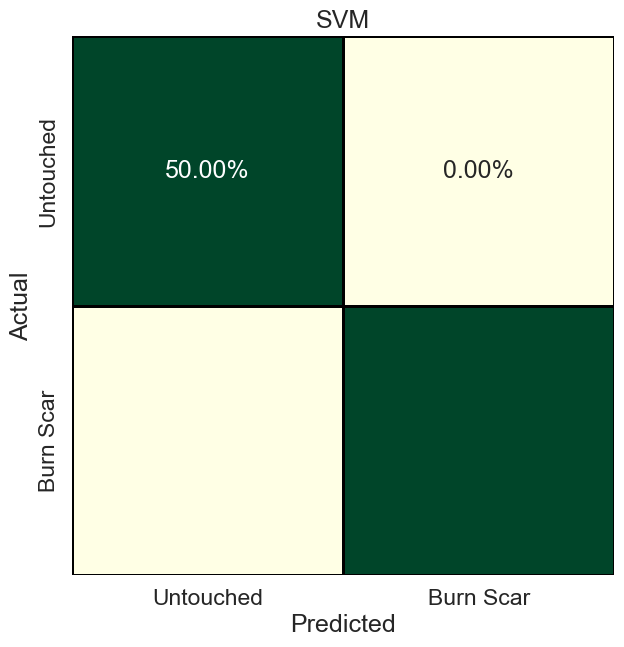

In [17]:
classes = ['Untouched', 'Burn Scar']

cName = 'SVM'
clf = SVC(kernel='rbf')
clf.fit(X_train, y_train)

clf_pred = clf.predict(X_test)

print(f"Accuracy {cName}: {accuracy_score(y_test, clf_pred)*100}")
print(classification_report(y_test, clf_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, clf_pred)
print('Confusion Matrix RF: \n',cm)
cm_percent = cm/np.sum(cm)

plt.figure(figsize=(7, 7), facecolor='w', edgecolor='k')
sns.set(font_scale=1.5)

sns.heatmap(cm_percent,
            xticklabels=classes,
            yticklabels=classes,
            cmap="YlGn",
            annot=True,
            fmt='.2%',
            cbar=False,
            linewidths=2,
            linecolor='black')

plt.title(cName)
plt.xlabel('Predicted')
plt.ylabel('Actual')

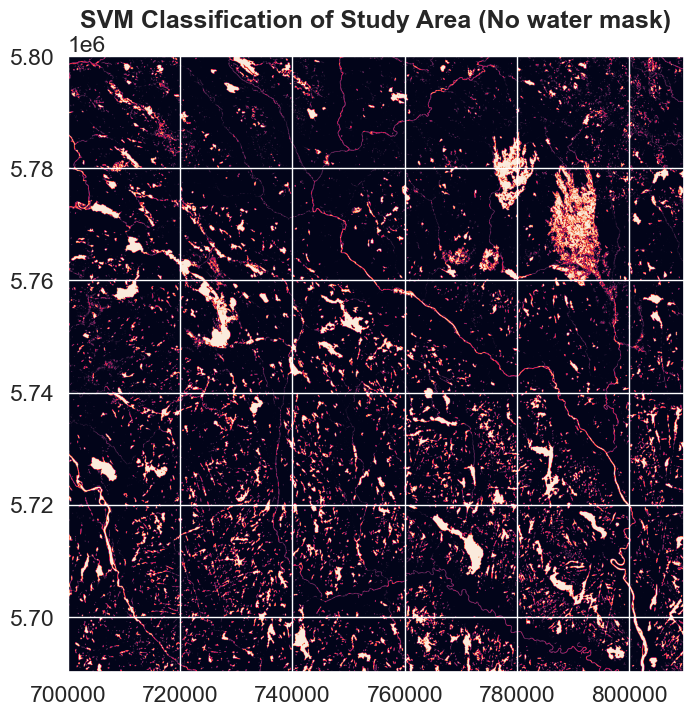

CPU times: total: 12.8 s
Wall time: 20.4 s


<Axes: title={'center': 'SVM Classification of Study Area (No water mask)'}>

In [18]:
%%time

svm_pred = clf.predict(img1d).reshape(empty_array[:,:,0].shape)

# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the false colour composite
title = "SVM Classification of Study Area (No water mask)"
show(svm_pred, transform=nbr_raster.transform, title=title)

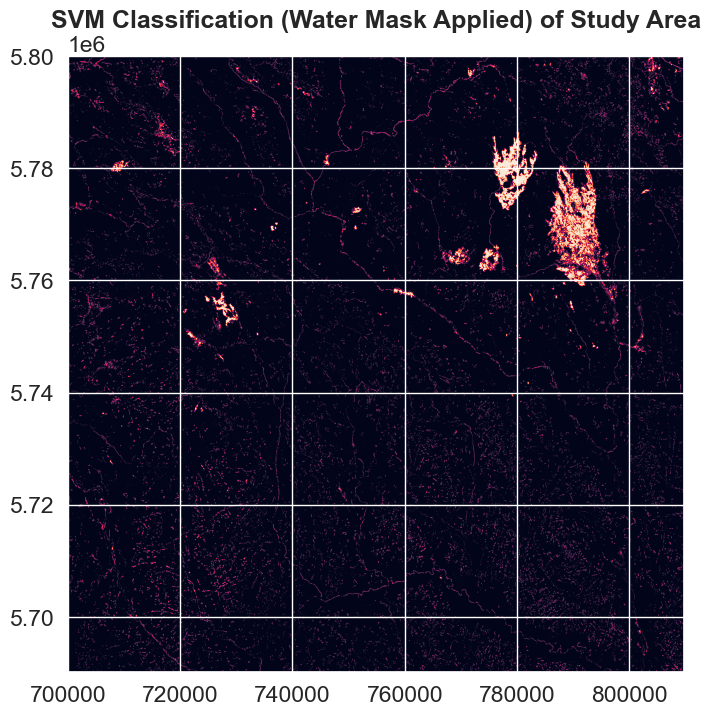

<Axes: title={'center': 'SVM Classification (Water Mask Applied) of Study Area'}>

In [19]:
# Remove water from classified raster

no_water_svm = svm_pred.astype(rio.float32) + water_array.astype(rio.float32)
#print(no_water)

svm_no_water = np.where(no_water_svm > 1, 0, no_water_svm)
#print(classified_no_water)

meta = water_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

svm_path = '../Raster/studyArea_svmClassification.tif'

with rio.open(svm_path, 'w', **meta) as dest:
    dest.write(svm_no_water.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "SVM Classification (Water Mask Applied) of Study Area"
show(svm_no_water, transform=nbr_raster.transform, title=title)

Based on our SVM classification, as of Sept 22, 2023, ~14,181.44 hectares of land has been damaged by wildfires.



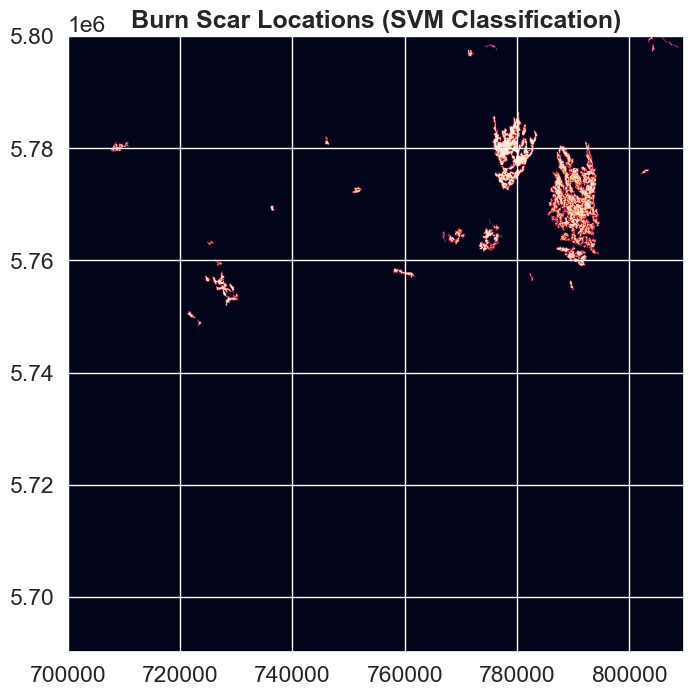

<Axes: title={'center': 'Burn Scar Locations (SVM Classification)'}>

In [20]:
# Clean the svm classification by removing noise

# Read in the classified raster and convert to boolean
svm_raster = rio.open(svm_path)
svm_array = svm_raster.read().astype(bool)

# Use skimage to remove pixel clusters that are smaller in size
cleaned = morphology.remove_small_objects(svm_array, min_size=600, connectivity=1)

# Get count of True pixels (pixels that are burned)
burn_pixels = np.count_nonzero(cleaned == True)

# Get total burnt area in hectares
# Number of pixels times 20x20 m pixel size divided by 10000
total_area_hect = burn_pixels * 400 / 10000

print(f"Based on our SVM classification, as of Sept 22, 2023, ~{total_area_hect:,.2f} hectares of land has been damaged by wildfires.\n")

meta = svm_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

burn_scar_path = '../Raster/burnScars_SVMClassification.tif'

with rio.open(burn_scar_path, 'w', **meta) as dest:
    dest.write(cleaned.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Burn Scar Locations (SVM Classification)"
show(cleaned, transform=nbr_raster.transform, title=title)


Accuracy RF: 100.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        15
           1       1.00      1.00      1.00        15

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

Confusion Matrix RF: 
 [[15  0]
 [ 0 15]]


Text(48.74999999999999, 0.5, 'Actual')

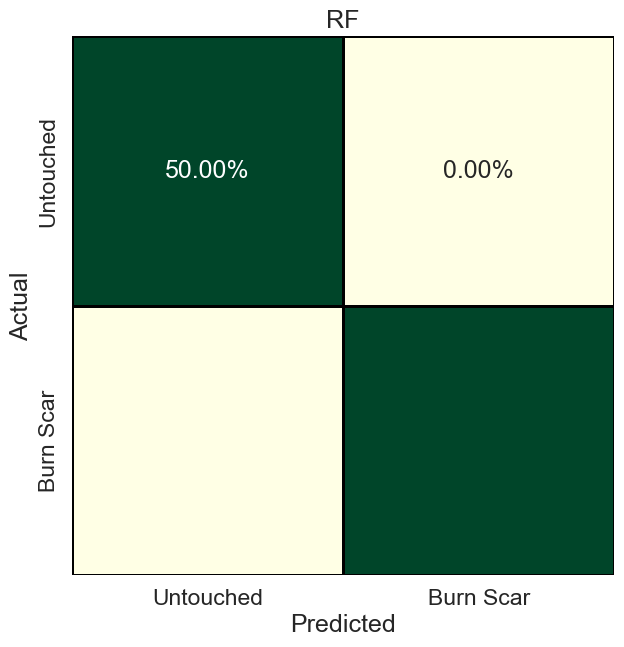

In [23]:
# Let's do a Random Forest Classifier

cName = 'RF'


clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

clf_rf = clf.predict(X_test)

print(f"Accuracy {cName}: {accuracy_score(y_test, clf_rf)*100}")
print(classification_report(y_test, clf_rf))


# Confusion Matrix

cm = confusion_matrix(y_test, clf_rf)
print('Confusion Matrix RF: \n',cm)
cm_percent = cm/np.sum(cm)

plt.figure(figsize=(7, 7), facecolor='w', edgecolor='k')
sns.set(font_scale=1.5)

sns.heatmap(cm_percent,
            xticklabels=classes,
            yticklabels=classes,
            cmap="YlGn",
            annot=True,
            fmt='.2%',
            cbar=False,
            linewidths=2,
            linecolor='black')

plt.title(cName)
plt.xlabel('Predicted')
plt.ylabel('Actual')

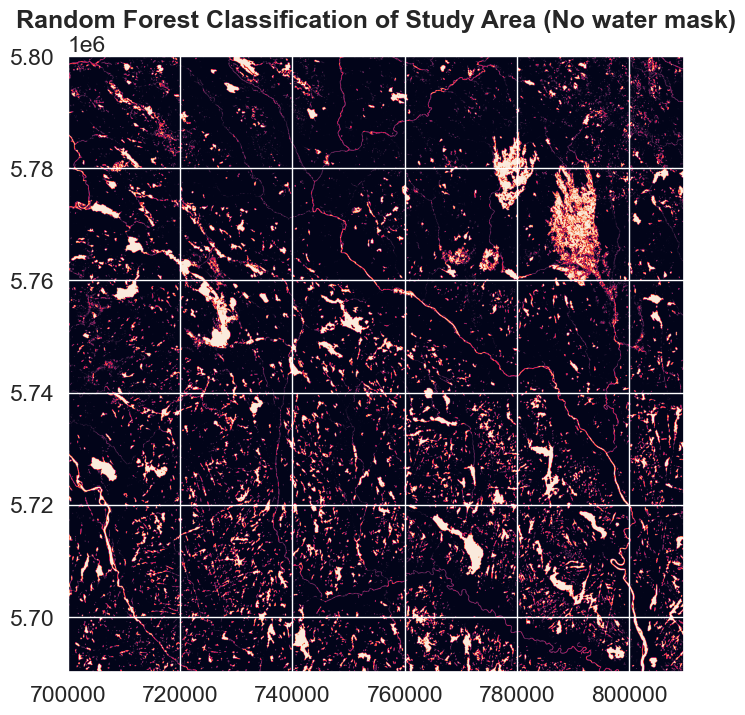

CPU times: total: 54.1 s
Wall time: 1min 7s


<Axes: title={'center': 'Random Forest Classification of Study Area (No water mask)'}>

In [24]:
%%time

rf_pred = clf.predict(img1d).reshape(empty_array[:,:,0].shape)

# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the false colour composite
title = "Random Forest Classification of Study Area (No water mask)"
show(rf_pred, transform=nbr_raster.transform, title=title)

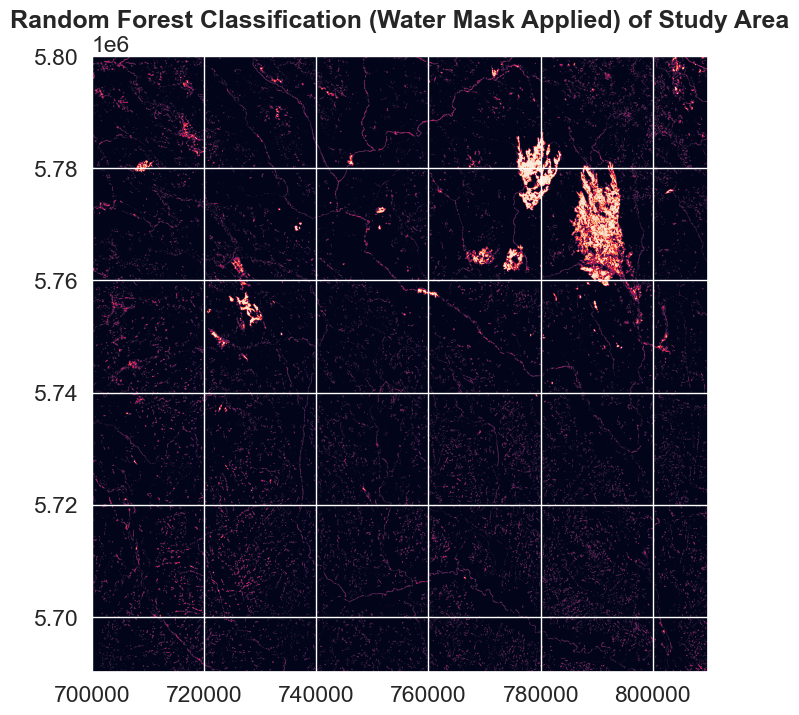

<Axes: title={'center': 'Random Forest Classification (Water Mask Applied) of Study Area'}>

In [25]:
# Remove water from classified raster

no_water_rf =rf_pred.astype(rio.float32) + water_array.astype(rio.float32)
#print(no_water)

rf_no_water = np.where(no_water_rf > 1, 0, no_water_rf)
#print(classified_no_water)

meta = water_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

rf_path = '../Raster/studyArea_rfClassification.tif'

with rio.open(rf_path, 'w', **meta) as dest:
    dest.write(rf_no_water.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Random Forest Classification (Water Mask Applied) of Study Area"
show(rf_no_water, transform=nbr_raster.transform, title=title)

Based on our Random Forest classification, as of Sept 22, 2023, ~15,022.56 hectares of land has been damaged by wildfires.



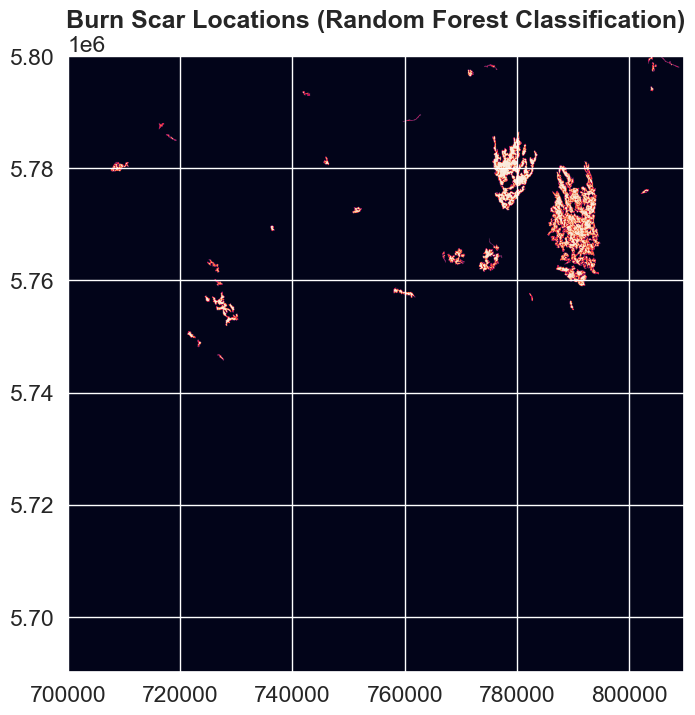

<Axes: title={'center': 'Burn Scar Locations (Random Forest Classification)'}>

In [27]:
# Clean the rf classification by removing noise

# Read in the classified raster and convert to boolean
rf_raster = rio.open(rf_path)
rf_array = rf_raster.read().astype(bool)

# Use skimage to remove pixel clusters that are smaller in size
cleaned = morphology.remove_small_objects(rf_array, min_size=600, connectivity=1)

# Get count of True pixels (pixels that are burned)
burn_pixels = np.count_nonzero(cleaned == True)

# Get total burnt area in hectares
# Number of pixels times 20x20 m pixel size divided by 10000
total_area_hect = burn_pixels * 400 / 10000

print(f"Based on our Random Forest classification, as of Sept 22, 2023, ~{total_area_hect:,.2f} hectares of land has been damaged by wildfires.\n")

meta = rf_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

burn_scar_path = '../Raster/burnScars_RFClassification.tif'

with rio.open(burn_scar_path, 'w', **meta) as dest:
    dest.write(cleaned.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Burn Scar Locations (Random Forest Classification)"
show(cleaned, transform=nbr_raster.transform, title=title)

Accuracy DT: 100.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        15
           1       1.00      1.00      1.00        15

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

Confusion Matrix RF: 
 [[15  0]
 [ 0 15]]
CPU times: total: 0 ns
Wall time: 18 ms


Text(48.74999999999999, 0.5, 'Actual')

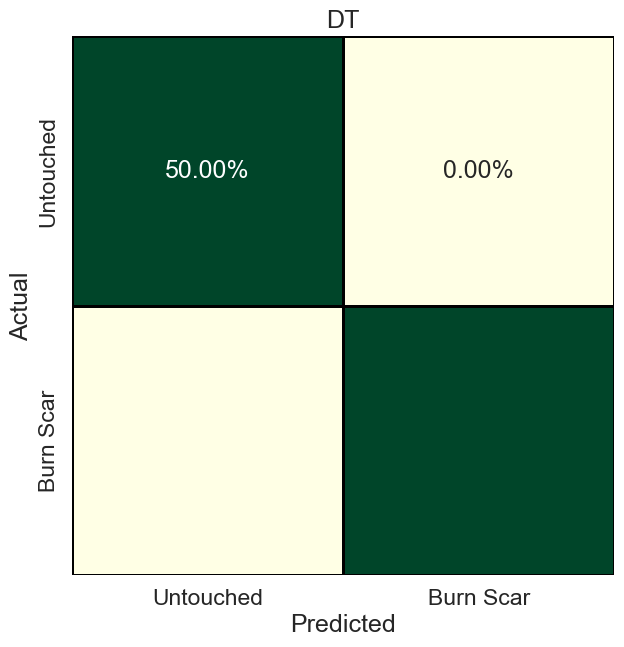

In [31]:
%%time

cName = 'DT'

clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

clf_dt = clf.predict(X_test)

print(f"Accuracy {cName}: {accuracy_score(y_test, clf_pred)*100}")
print(classification_report(y_test, clf_dt))


# Confusion Matrix

cm = confusion_matrix(y_test, clf_dt)
print('Confusion Matrix RF: \n',cm)
cm_percent = cm/np.sum(cm)

plt.figure(figsize=(7, 7), facecolor='w', edgecolor='k')
sns.set(font_scale=1.5)

sns.heatmap(cm_percent,
            xticklabels=classes,
            yticklabels=classes,
            cmap="YlGn",
            annot=True,
            fmt='.2%',
            cbar=False,
            linewidths=2,
            linecolor='black')

plt.title(cName)
plt.xlabel('Predicted')
plt.ylabel('Actual')

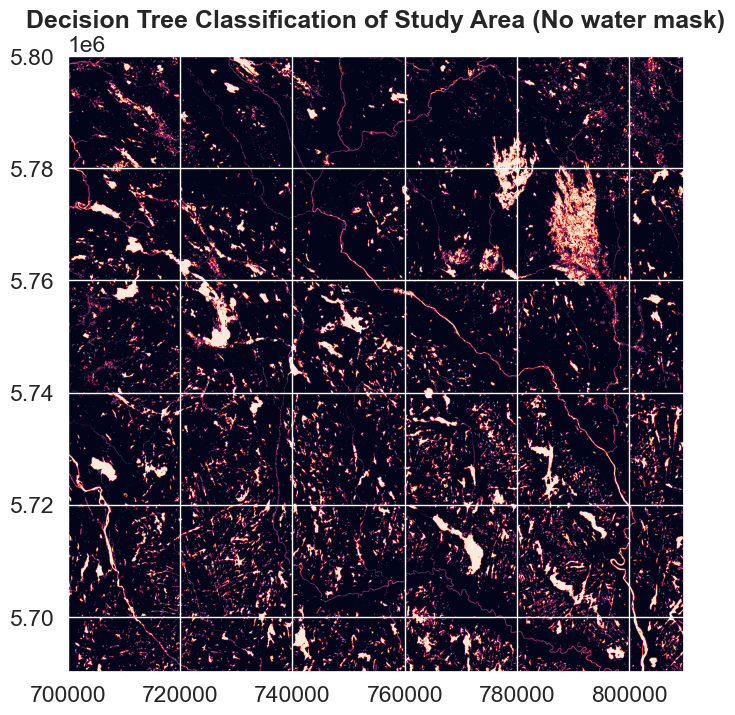

CPU times: total: 812 ms
Wall time: 1.47 s


<Axes: title={'center': 'Decision Tree Classification of Study Area (No water mask)'}>

In [32]:
%%time

dt_pred = clf.predict(img1d).reshape(empty_array[:,:,0].shape)

# Define a plot
fig = plt.figure(figsize=(8,8))

# Show the false colour composite
title = "Decision Tree Classification of Study Area (No water mask)"
show(dt_pred, transform=nbr_raster.transform, title=title)

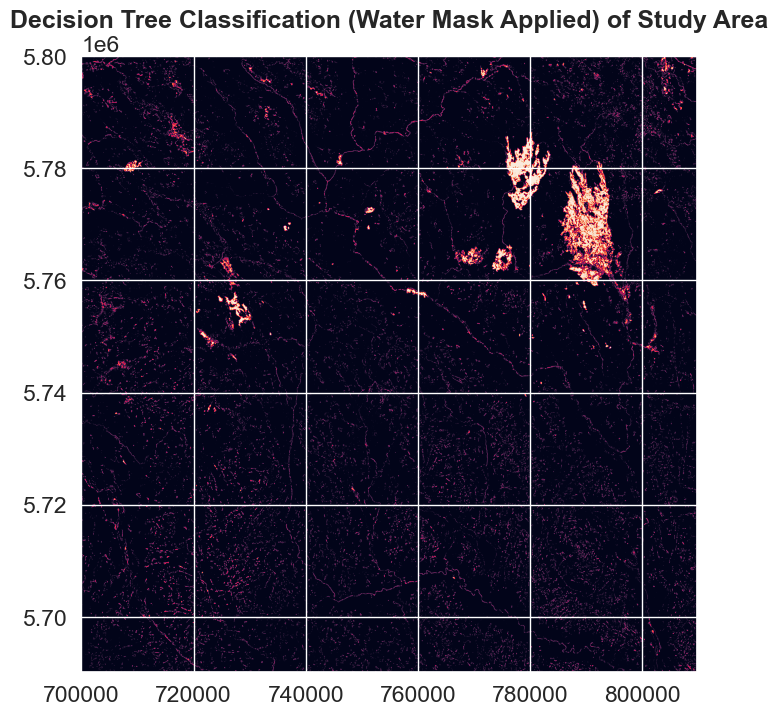

<Axes: title={'center': 'Decision Tree Classification (Water Mask Applied) of Study Area'}>

In [33]:
# Remove water from classified raster

no_water_dt =dt_pred.astype(rio.float32) + water_array.astype(rio.float32)
#print(no_water)

dt_no_water = np.where(no_water_dt > 1, 0, no_water_dt)
#print(classified_no_water)

meta = water_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

dt_path = '../Raster/studyArea_dtClassification.tif'

with rio.open(dt_path, 'w', **meta) as dest:
    dest.write(dt_no_water.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Decision Tree Classification (Water Mask Applied) of Study Area"
show(dt_no_water, transform=nbr_raster.transform, title=title)

Based on our Decision Tree classification, as of Sept 22, 2023, ~15,022.56 hectares of land has been damaged by wildfires.



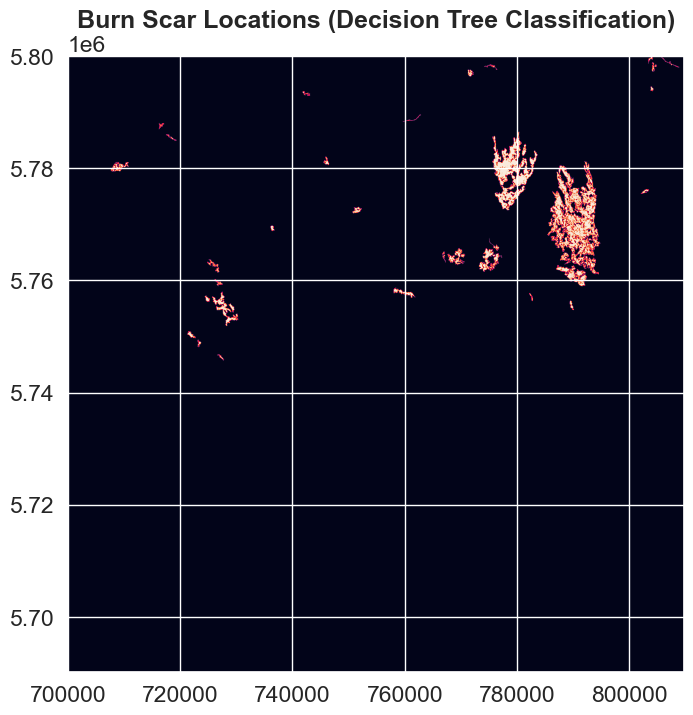

<Axes: title={'center': 'Burn Scar Locations (Decision Tree Classification)'}>

In [34]:
# Clean the dt classification by removing noise

# Read in the classified raster and convert to boolean
dt_raster = rio.open(dt_path)
dt_array = dt_raster.read().astype(bool)

# Use skimage to remove pixel clusters that are smaller in size
cleaned = morphology.remove_small_objects(dt_array, min_size=600, connectivity=1)

# Get count of True pixels (pixels that are burned)
burn_pixels = np.count_nonzero(cleaned == True)

# Get total burnt area in hectares
# Number of pixels times 20x20 m pixel size divided by 10000
total_area_hect = burn_pixels * 400 / 10000

print(f"Based on our Decision Tree classification, as of Sept 22, 2023, ~{total_area_hect:,.2f} hectares of land has been damaged by wildfires.\n")

meta = dt_raster.meta
meta.update(driver='GTiff')
meta.update(dtype=rio.float32)

burn_scar_path = '../Raster/burnScars_DTClassification.tif'

with rio.open(burn_scar_path, 'w', **meta) as dest:
    dest.write(cleaned.astype(rio.float32))

fig = plt.figure(figsize=(8,8))
title = "Burn Scar Locations (Decision Tree Classification)"
show(cleaned, transform=nbr_raster.transform, title=title)

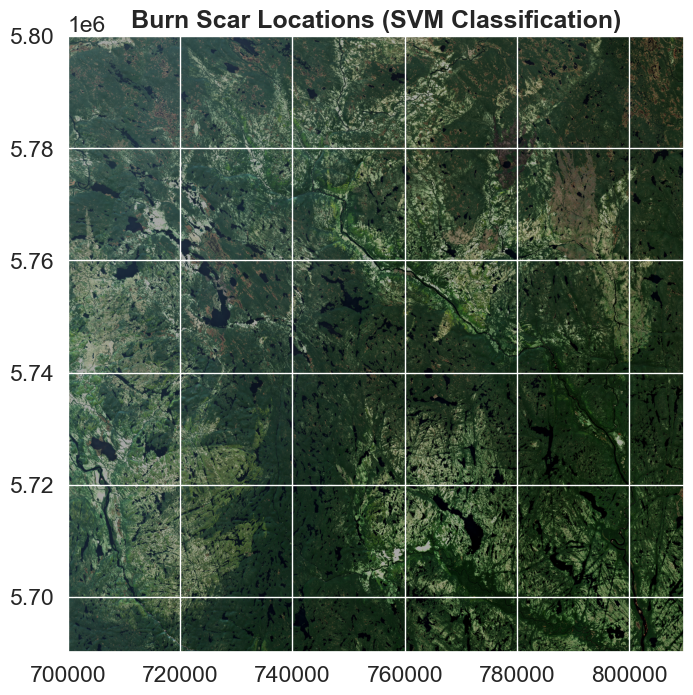

<Axes: >

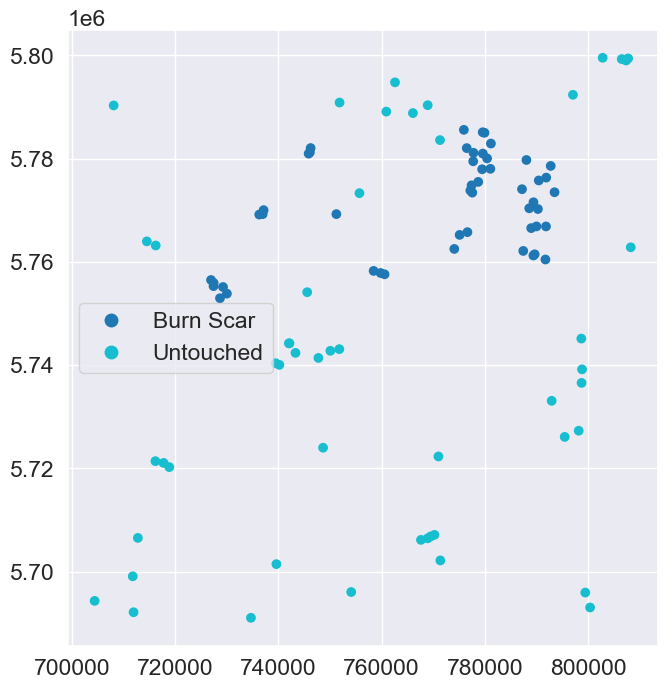

In [21]:
# Trying to show training data on NBR
fig, ax = plt.subplots(figsize=(8, 8))
show(natural_comp_array.transpose(2,0,1), transform=natural_comp_raster.transform, title=title)
training_data.plot(column='Classname', cmap=None, legend=True, figsize=(8, 8))